In [1]:
!pip install ydata-profiling

In [2]:
import pandas as pd
import numpy as np
import math, time, random, datetime

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme(style="whitegrid")

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Profiling
from ydata_profiling import ProfileReport

from sklearn.preprocessing import OneHotEncoder, StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, cross_val_predict
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from xgboost import XGBClassifier

from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
import joblib

import warnings
warnings.filterwarnings("ignore")

# **Data Exploration**

In [3]:
df = pd.read_csv("/content/sample_data/WA_Fn-UseC_-HR-Employee-Attrition.csv")
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [4]:
print("Dataset Shape:", df.shape)

Dataset Shape: (1470, 35)


In [5]:
# Read more info about data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

> No missing values in columns

> Most of columns are numeric (26) columns

In [6]:
# Profile Report
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 35/35 [00:01<00:00, 24.80it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

> StandardHours: unique value 80 (we could drop this col later)

> EmployeeCount: Always 0 (We will drop it later from the data)

> EmployeeNumber: Just work as ID (We will remove it later cause it won't be useful for analysis nor modeling)

> Over18: is always True

In [7]:
# Drop Useless Columns
df.drop(['EmployeeNumber', 'Over18', 'StandardHours', 'EmployeeCount'],
        axis=1, inplace=True)

In [8]:
df.shape

(1470, 31)

In [9]:
# Explore statistics of numeric features
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.0,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.0,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.0,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.0,3.0,4.00,5.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.0,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.0,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.0,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.0,2.0,3.00,5.0
JobSatisfaction,1470.0,2.728571,1.102846,1.0,2.0,3.0,4.00,4.0
MonthlyIncome,1470.0,6502.931293,4707.956783,1009.0,2911.0,4919.0,8379.00,19999.0


Some of the observations from the above statistics:

> For Age: The age of employees starts from 18 and ends at 60

> Education: is labeled from 1 to 5

> EnvironmentSatisfaction: is labeled from 1 to 4

> JobInvolvement: is labeled from 1 to 4

> JobLevel: is labeled from 1 to 5

> JobSatisfaction: is labeled from 1 to 4

> RelationshipSatisfaction: is labeled from 1 to 4

> WorkLifeBalance: is labeled from 1 to 4

In [10]:
# Explore statistical analysis of categorical features
df.describe(include=object).T

,count,unique,top,freq
Attrition,1470,2,No,1233
BusinessTravel,1470,3,Travel_Rarely,1043
Department,1470,3,Research & Development,961
EducationField,1470,6,Life Sciences,606
Gender,1470,2,Male,882
JobRole,1470,9,Sales Executive,326
MaritalStatus,1470,3,Married,673
OverTime,1470,2,No,1054


Some observations from the statistics above:
> Most employees didn't leave the company (1233 from 1470)

> Most employees are from Males (882 from 1470)

> Majority work in Research & Development (961 from 1470)

> Dominant in EducationField is Life Sciences (606 from 1470)

> A good ratio of employees refer that they married (673 from 1470)

> Major employees don't work overtime (1054 from 1470)

In [11]:
df.duplicated().sum()

np.int64(0)

# **Exploratory Data Analysis**

In [12]:
# Take a copy of our data and make analysis on it as we like!
df_vis = df.copy()

Mapping for more insightful analysis!

In [13]:
# Education mapping
education_map = {
    1: 'Below College',
    2: 'College',
    3: 'Bachelor',
    4: 'Master',
    5: 'Doctor'
}
df_vis['Education'] = df_vis['Education'].map(education_map)

# EnvironmentSatisfaction mapping
env_satisfaction_map = {
    1: 'Low',
    2: 'Medium',
    3: 'High',
    4: 'Very High'
}
df_vis['EnvironmentSatisfaction'] = df_vis['EnvironmentSatisfaction'].map(env_satisfaction_map)

# JobInvolvement mapping
job_involvement_map = {
    1: 'Low',
    2: 'Medium',
    3: 'High',
    4: 'Very High'
}
df_vis['JobInvolvement'] = df_vis['JobInvolvement'].map(job_involvement_map)

# JobSatisfaction mapping
job_satisfaction_map = {
    1: 'Low',
    2: 'Medium',
    3: 'High',
    4: 'Very High'
}
df_vis['JobSatisfaction'] = df_vis['JobSatisfaction'].map(job_satisfaction_map)

# PerformanceRating mapping
performance_rating_map = {
    1: 'Low',
    2: 'Good',
    3: 'Excellent',
    4: 'Outstanding'
}
df_vis['PerformanceRating'] = df_vis['PerformanceRating'].map(performance_rating_map)

# RelationshipSatisfaction mapping
relationship_map = {
    1: 'Low',
    2: 'Medium',
    3: 'High',
    4: 'Very High'
}
df_vis['RelationshipSatisfaction'] = df_vis['RelationshipSatisfaction'].map(relationship_map)

# WorkLifeBalance mapping
worklife_map = {
    1: 'Bad',
    2: 'Good',
    3: 'Better',
    4: 'Best'
}
df_vis['WorkLifeBalance'] = df_vis['WorkLifeBalance'].map(worklife_map)

In [14]:
df_vis.head().T

,0,1,2,3,4
Age,41,49,37,33,27
Attrition,Yes,No,Yes,No,No
BusinessTravel,Travel_Rarely,Travel_Frequently,Travel_Rarely,Travel_Frequently,Travel_Rarely
DailyRate,1102,279,1373,1392,591
Department,Sales,Research & Development,Research & Development,Research & Development,Research & Development
DistanceFromHome,1,8,2,3,2
Education,College,Below College,College,Master,Below College
EducationField,Life Sciences,Life Sciences,Other,Life Sciences,Medical
EnvironmentSatisfaction,Medium,High,Very High,Very High,Low
Gender,Female,Male,Male,Female,Male


In [15]:
df_vis.describe(include='object')

,Attrition,BusinessTravel,Department,Education,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobRole,JobSatisfaction,MaritalStatus,OverTime,PerformanceRating,RelationshipSatisfaction,WorkLifeBalance
count,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470,1470
unique,2,3,3,5,6,4,2,4,9,4,3,2,2,4,4
top,No,Travel_Rarely,Research & Development,Bachelor,Life Sciences,High,Male,High,Sales Executive,Very High,Married,No,Excellent,High,Better
freq,1233,1043,961,572,606,453,882,868,326,459,673,1054,1244,459,893


## Univariate Analysis

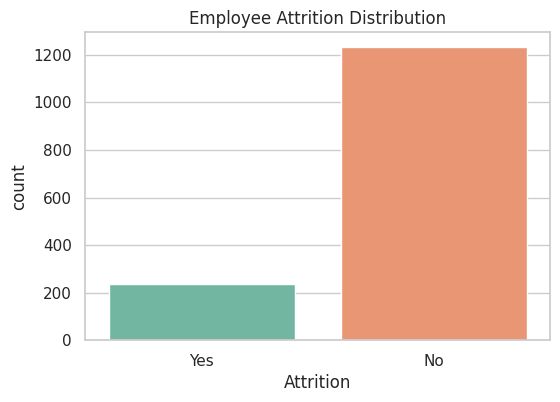

In [16]:
# Distribution of target column
plt.figure(figsize=(6,4))
sns.countplot(data=df_vis, x="Attrition", palette="Set2")
plt.title("Employee Attrition Distribution")
plt.show()

> Imbalance data

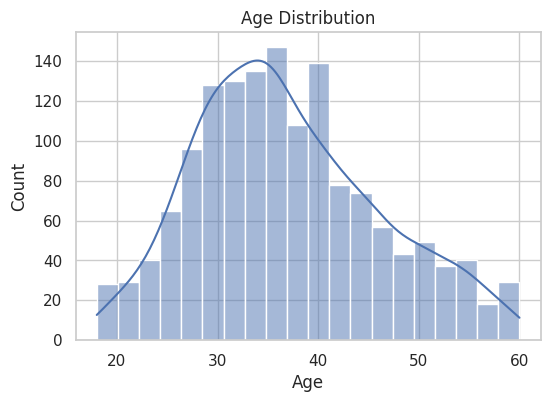

In [17]:
plt.figure(figsize=(6,4))
sns.histplot(df_vis["Age"], bins=20, kde=True)
plt.title("Age Distribution")
plt.show()

> Most people in company are in youth age (25 - 45)

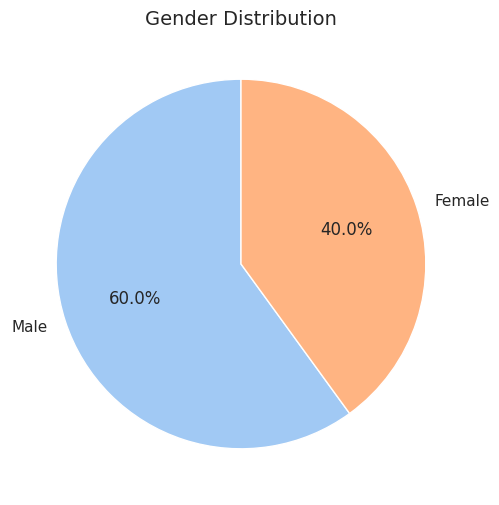

In [18]:
colors = sns.color_palette("pastel")

plt.figure(figsize=(6,6))
plt.pie(
    df["Gender"].value_counts(),
    labels=df["Gender"].value_counts().index,
    autopct="%1.1f%%",
    startangle=90,
    colors=colors
)

plt.title("Gender Distribution", fontsize=14)
plt.show()

> Male samples more than feamale one

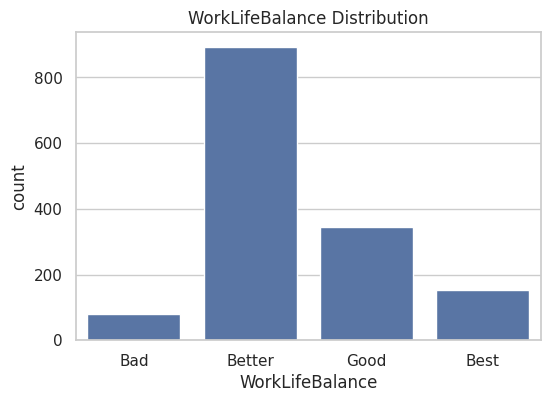

In [19]:
plt.figure(figsize=(6,4))
sns.countplot(data=df_vis, x="WorkLifeBalance")
plt.title("WorkLifeBalance Distribution")
plt.show()

> Very little sample of employees with bad life balance

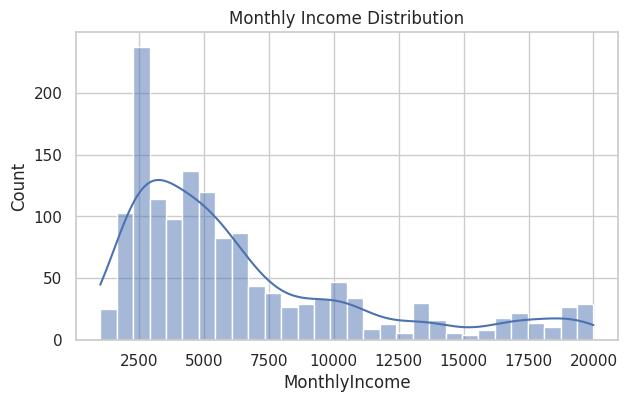

In [20]:
plt.figure(figsize=(7,4))
sns.histplot(df_vis["MonthlyIncome"], kde=True, bins=30)
plt.title("Monthly Income Distribution")
plt.show()

## Bivariate Analysis

In [21]:
attrition = df[df['Attrition']=='Yes']
no_attrition = df[df['Attrition']=='No']

In [22]:
# Numerical Column Visualization Function

def numerical_column_viz(col_name):
    f, ax = plt.subplots(1, 2, figsize=(16, 5))

    sns.kdeplot(attrition[col_name], shade=True, label='Left', color='salmon', ax=ax[0])
    sns.kdeplot(no_attrition[col_name], shade=True, label='Stayed', color='green', ax=ax[0])
    ax[0].set_title(f'Distribution of {col_name}')

    sns.boxplot(x='Attrition', y=col_name, data=df_vis, ax=ax[1], palette='Set3')

    plt.show()

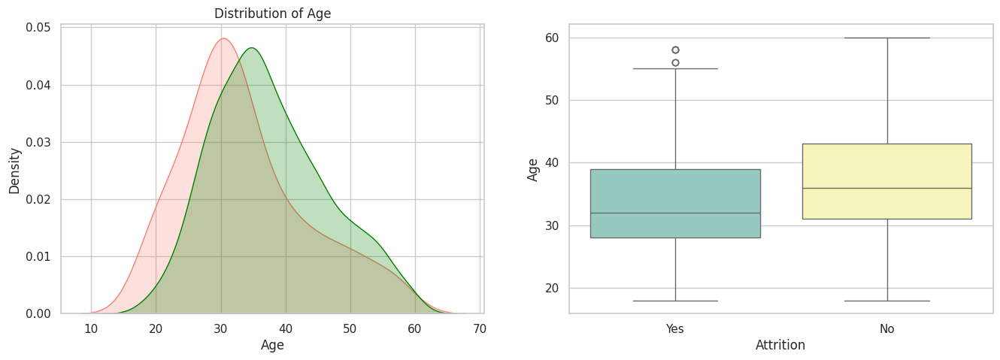

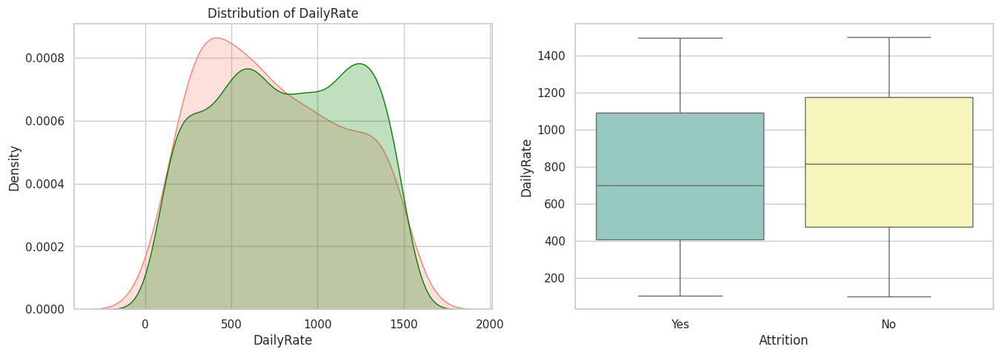

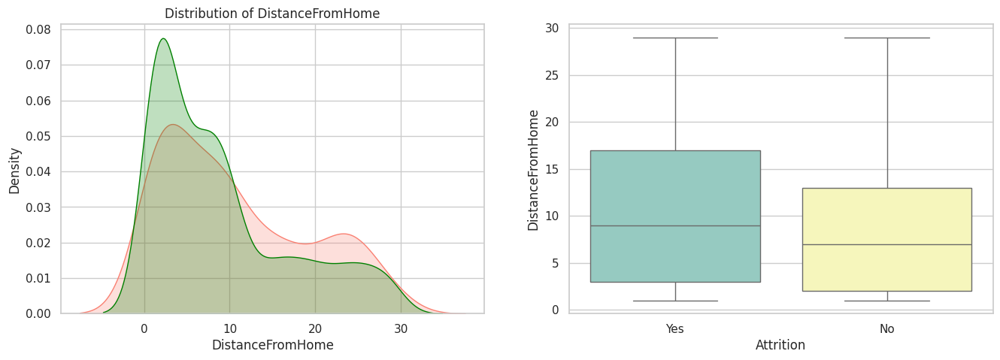

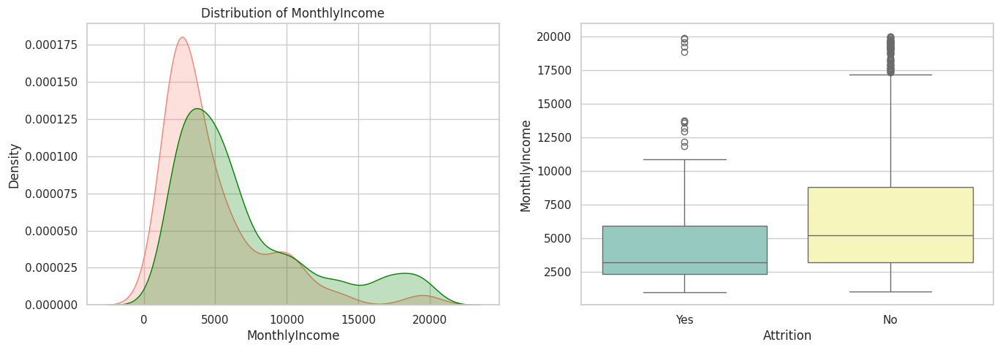

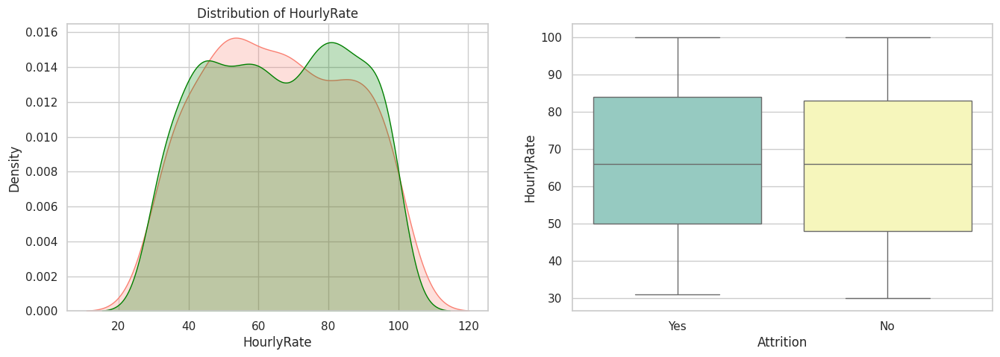

...

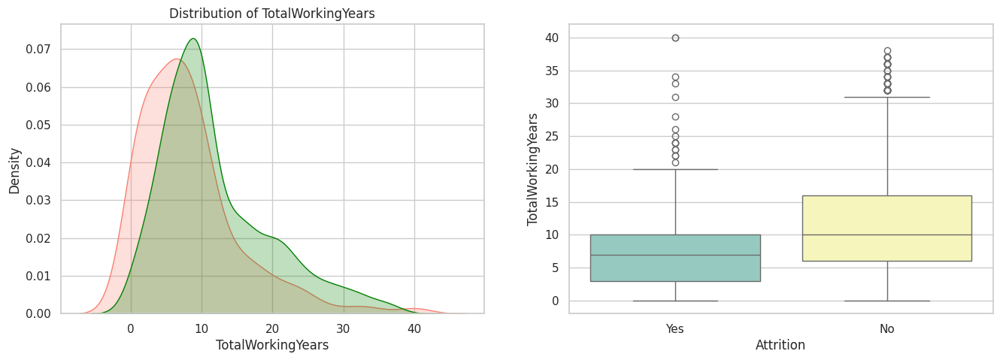

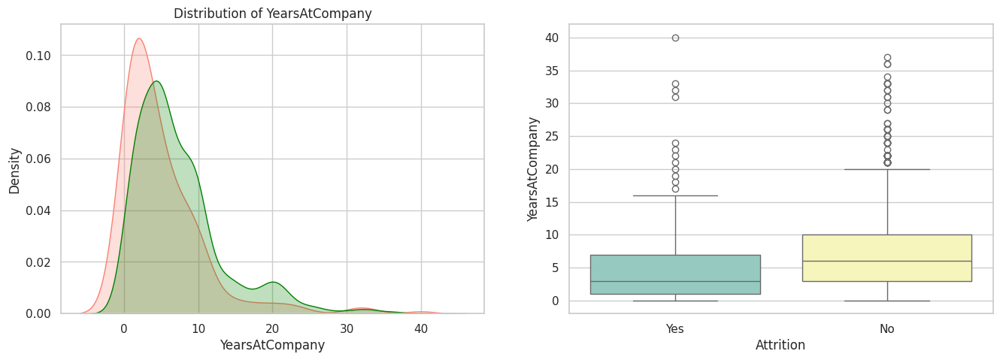

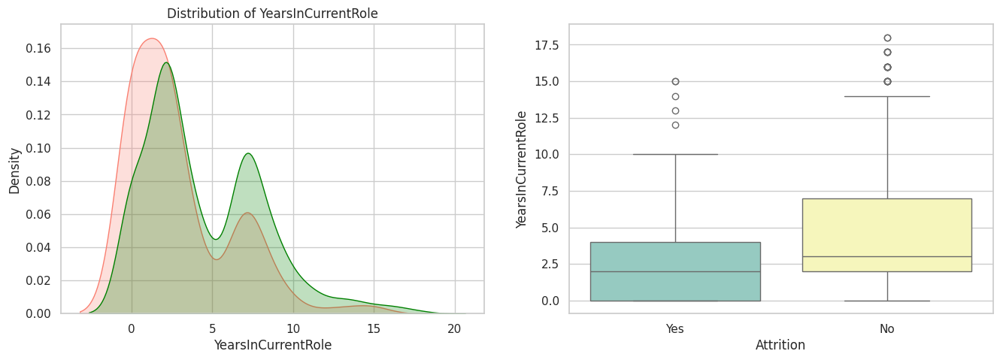

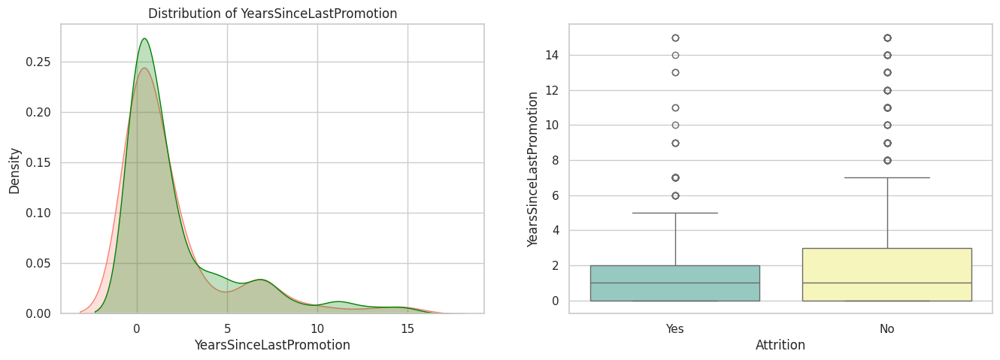

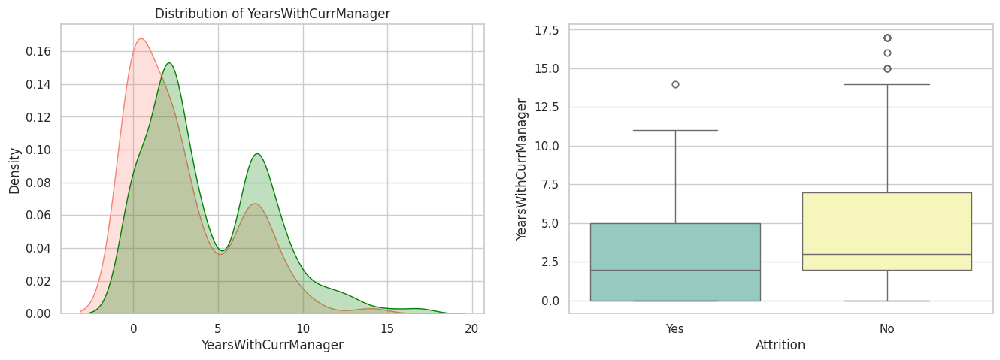

In [23]:
numerical_columns = [
    "Age","DailyRate","DistanceFromHome","MonthlyIncome","HourlyRate",
    "PercentSalaryHike","TotalWorkingYears","YearsAtCompany",
    "YearsInCurrentRole","YearsSinceLastPromotion","YearsWithCurrManager"
]

for col in numerical_columns:
    numerical_column_viz(col)

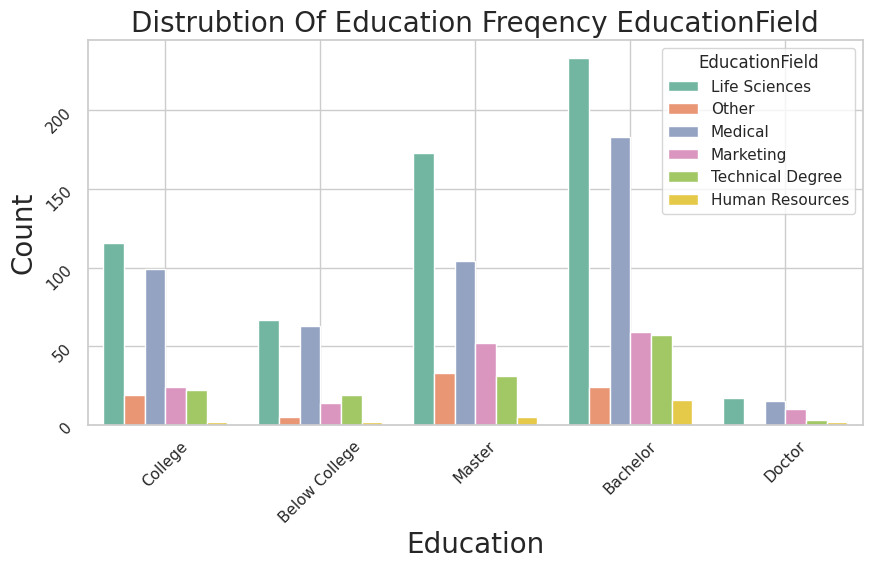

In [24]:
plt.figure(figsize=(10,5))

sns.countplot(x='Education',hue='EducationField',data=df_vis,palette='Set2')
plt.grid(True)
plt.title('Distrubtion Of Education Freqency EducationField',fontsize=20)
plt.xlabel('Education',fontsize=20)
plt.ylabel('Count',fontsize=20)
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()

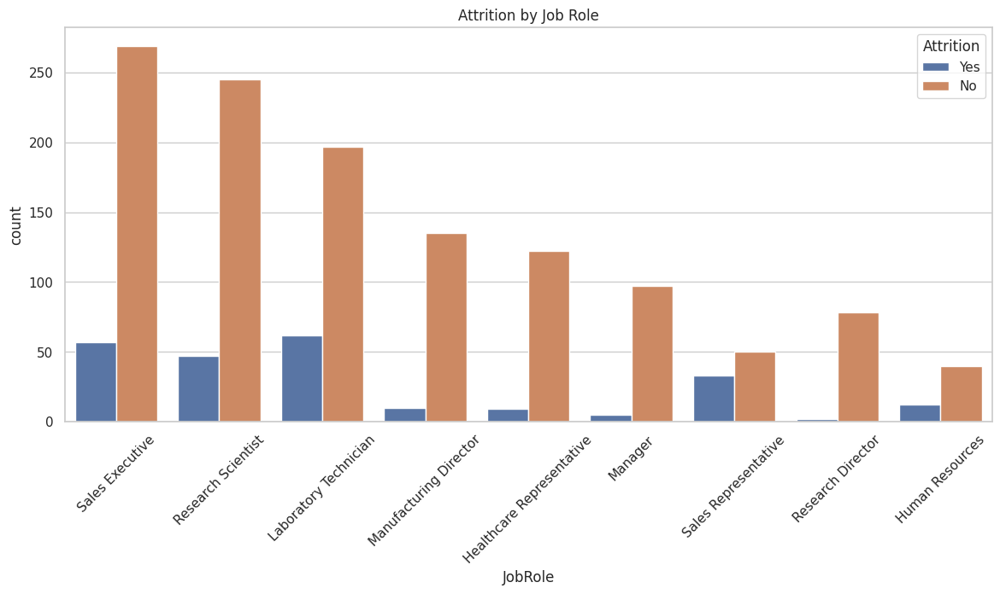

In [25]:
plt.figure(figsize=(14,6))
sns.countplot(data=df_vis, x="JobRole", hue="Attrition")
plt.xticks(rotation=45)
plt.title("Attrition by Job Role")
plt.show()

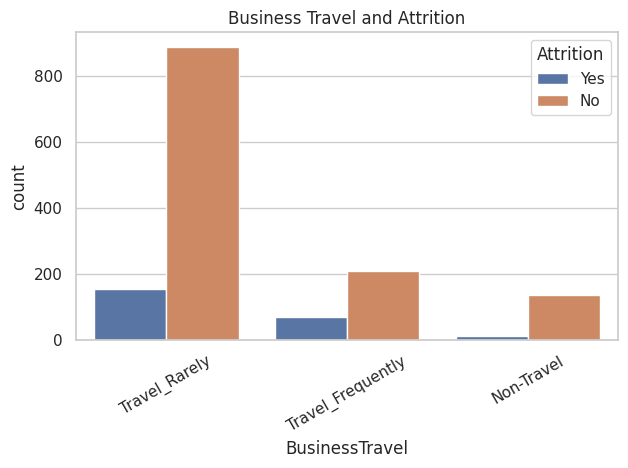

In [26]:
plt.figure(figsize=(7,4))
sns.countplot(data=df, x="BusinessTravel", hue="Attrition")
plt.title("Business Travel and Attrition")
plt.xticks(rotation=30)
plt.show()

> Employees that don't travel are the most loyal and not leave the company

> Comparing the number that stay and leave the employees that travel freq have the most probability to leave, company should concentrate on them

# **Preprocessing**

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

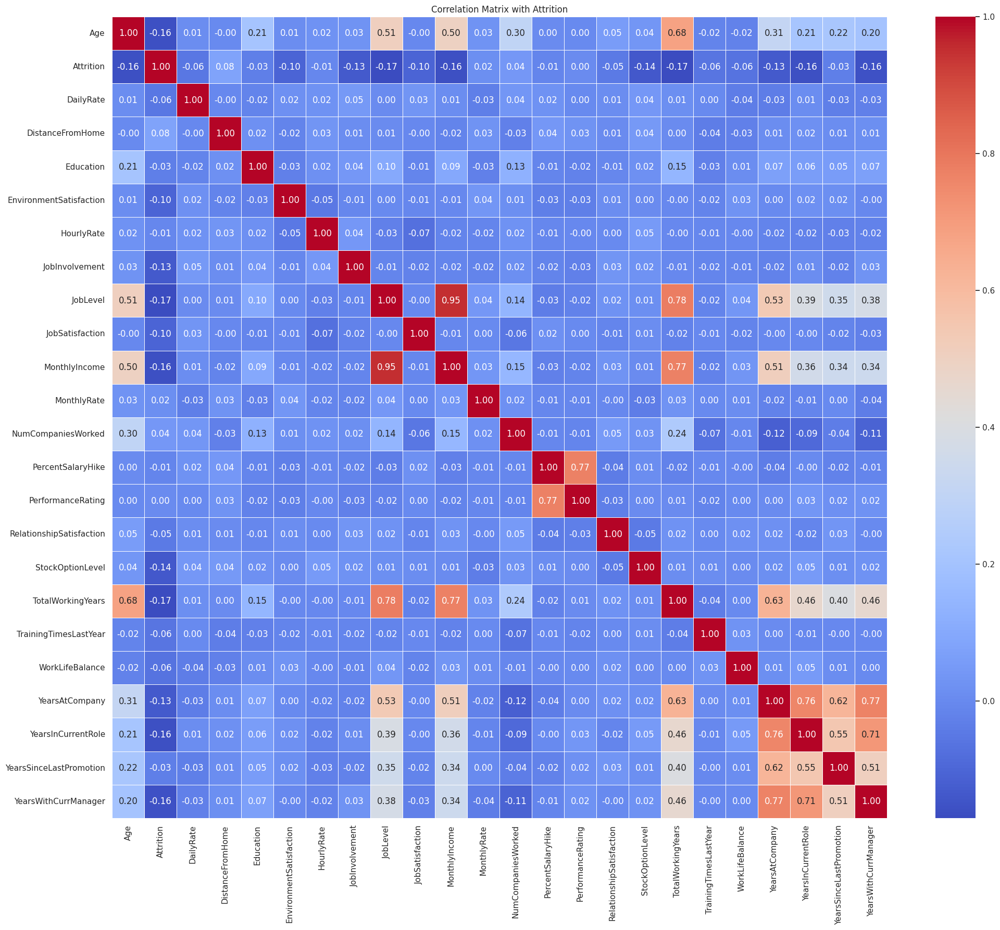

In [28]:
# correlation matrix
df_corr = df.copy()

df_corr['Attrition'] = df_corr['Attrition'].map({"Yes":1,"No":0})
numeric_cols = df_corr.select_dtypes(include=['int64','float64']).columns

plt.figure(figsize=(24,20))
sns.heatmap(df_corr[numeric_cols].corr(), annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Matrix with Attrition")
plt.show()

In [29]:
# drop monthlyincome (multicollinearity)
df.drop("MonthlyIncome", axis=1, inplace=True)

In [30]:
numeric_cols = df.select_dtypes(include=['int64','float64']).columns

In [31]:
# StandardScaler
scaler = StandardScaler()
df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

In [32]:
# Categorical features
categorical_cols = [
    "Attrition","BusinessTravel","Department",
    "EducationField","Gender","JobRole","MaritalStatus","OverTime"
]

In [33]:
# Binary Encoding
binary_map = {"Yes":1,"No":0,"Male":1,"Female":0}
df["Attrition"] = df["Attrition"].map(binary_map)
df["OverTime"] = df["OverTime"].map(binary_map)
df["Gender"] = df["Gender"].map(binary_map)

In [34]:
# One-Hot Encoding for the rest
one_cols = ["BusinessTravel","Department","EducationField","JobRole","MaritalStatus"]
df = pd.get_dummies(df, columns=one_cols, drop_first=True)

df.head().T

,0,1,2,3,4
Age,0.44635,1.322365,0.008343,-0.429664,-1.086676
Attrition,1,0,1,0,0
DailyRate,0.742527,-1.297775,1.414363,1.461466,-0.524295
DistanceFromHome,-1.010909,-0.14715,-0.887515,-0.764121,-0.887515
Education,-0.891688,-1.868426,-0.891688,1.061787,-1.868426
EnvironmentSatisfaction,-0.660531,0.254625,1.169781,1.169781,-1.575686
Gender,0,1,1,0,1
HourlyRate,1.383138,-0.240677,1.284725,-0.486709,-1.274014
JobInvolvement,0.379672,-1.026167,-1.026167,0.379672,0.379672
JobLevel,-0.057788,-0.057788,-0.961486,-0.961486,-0.961486


# **Modeling**

In [35]:
X = df.drop("Attrition", axis=1)
y = df["Attrition"]

In [36]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

Smote for solving imbalance in data

In [37]:
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

In [38]:
print("Before SMOTE:\n", y_train.value_counts())
print("After SMOTE:\n", y_train_res.value_counts())

Before SMOTE:
 Attrition
0    986
1    190
Name: count, dtype: int64
After SMOTE:
 Attrition
0    986
1    986
Name: count, dtype: int64


In [39]:
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=200, random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
}

In [40]:
for name, model in models.items():
    print(f"\n--- {name} ---")
    model.fit(X_train_res, y_train_res)

    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:,1]

    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))

    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    auc_score = roc_auc_score(y_test, y_prob)
    print(f"AUC Score: {auc_score:.3f}")


--- Logistic Regression ---
Confusion Matrix:
[[226  21]
 [ 28  19]]

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.91      0.90       247
           1       0.47      0.40      0.44        47

    accuracy                           0.83       294
   macro avg       0.68      0.66      0.67       294
weighted avg       0.82      0.83      0.83       294

AUC Score: 0.785

--- Random Forest ---
Confusion Matrix:
[[237  10]
 [ 39   8]]

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.96      0.91       247
           1       0.44      0.17      0.25        47

    accuracy                           0.83       294
   macro avg       0.65      0.56      0.58       294
weighted avg       0.79      0.83      0.80       294

AUC Score: 0.727

--- XGBoost ---
Confusion Matrix:
[[241   6]
 [ 32  15]]

Classification Report:
              precision    recall  f1-score   su

Tuning with Threshold

In [41]:
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
}

for name, model in models.items():
    print(f"\n--- {name} ---")
    model.fit(X_train_res, y_train_res)

    y_prob = model.predict_proba(X_test)[:,1]

    # Threshold optimization
    best_threshold = 0.5
    best_f1 = 0
    thresholds = np.arange(0.3, 0.71, 0.01)
    for t in thresholds:
        y_pred_t = (y_prob >= t).astype(int)
        f1 = classification_report(y_test, y_pred_t, output_dict=True)['1']['f1-score']
        if f1 > best_f1:
            best_f1 = f1
            best_threshold = t

    y_pred = (y_prob >= best_threshold).astype(int)

    print(f"Optimal Threshold: {best_threshold:.2f}")
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))

    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))

    auc_score = roc_auc_score(y_test, y_prob)
    print(f"AUC Score: {auc_score:.3f}")


--- Logistic Regression ---
Optimal Threshold: 0.41
Confusion Matrix:
[[215  32]
 [ 23  24]]

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.87      0.89       247
           1       0.43      0.51      0.47        47

    accuracy                           0.81       294
   macro avg       0.67      0.69      0.68       294
weighted avg       0.83      0.81      0.82       294

AUC Score: 0.785

--- XGBoost ---
Optimal Threshold: 0.43
Confusion Matrix:
[[241   6]
 [ 30  17]]

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.98      0.93       247
           1       0.74      0.36      0.49        47

    accuracy                           0.88       294
   macro avg       0.81      0.67      0.71       294
weighted avg       0.87      0.88      0.86       294

AUC Score: 0.773


Ensamble Model with LogisticRegression & XGBoost

In [42]:
logreg = LogisticRegression(max_iter=1000, random_state=42)
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

# Ensemble - Soft Voting
ensemble = VotingClassifier(
    estimators=[('lr', logreg), ('xgb', xgb)],
    voting='soft'
)

ensemble.fit(X_train_res, y_train_res)

y_prob = ensemble.predict_proba(X_test)[:,1]

# Threshold Optimization
best_threshold = 0.5
best_f1 = 0
thresholds = np.arange(0.3, 0.71, 0.01)
for t in thresholds:
    y_pred_t = (y_prob >= t).astype(int)
    f1 = classification_report(y_test, y_pred_t, output_dict=True)['1']['f1-score']
    if f1 > best_f1:
        best_f1 = f1
        best_threshold = t

y_pred = (y_prob >= best_threshold).astype(int)

print(f"Optimal Threshold: {best_threshold:.2f}")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
auc_score = roc_auc_score(y_test, y_prob)
print(f"AUC Score: {auc_score:.3f}")

Optimal Threshold: 0.39
Confusion Matrix:
[[236  11]
 [ 27  20]]

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.96      0.93       247
           1       0.65      0.43      0.51        47

    accuracy                           0.87       294
   macro avg       0.77      0.69      0.72       294
weighted avg       0.86      0.87      0.86       294

AUC Score: 0.798


In [43]:
joblib.dump(ensemble, "ensemble_attrition_model.pkl")

print("Model saved successfully!")

Model saved successfully!
